## Описание проекта

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.

Они просят подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

Для этого у нас есть датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.
 

**Описание данных**

Файл moscow_places.csv:

- name — название заведения;
- address — адрес заведения;
- category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
- hours — информация о днях и часах работы;
- lat — широта географической точки, в которой находится заведение;
- lng — долгота географической точки, в которой находится заведение;
- rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
- avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
-- «Средний счёт: 1000–1500 ₽»;
-- «Цена чашки капучино: 130–220 ₽»;
-- «Цена бокала пива: 400–600 ₽».
-- и так далее;
- middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
-- Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
-- Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
-- Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
- middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
-- Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
-- Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
-- Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
- chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
-- 0 — заведение не является сетевым
-- 1 — заведение является сетевым
- district — административный район, в котором находится заведение, например Центральный административный округ;
- seats — количество посадочных мест.

## Загрузка библиотек и данных

In [1]:
import warnings 
warnings.filterwarnings("ignore")

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from plotly.subplots import make_subplots
from plotly import graph_objects as go
import folium
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster
import json

In [2]:
try:
     df = pd.read_csv(r"D:\Проекты Яндекс.Практикум\DA\04 Как рассказать историю с помощью данных\moscow_places.csv" )
except: 
     df = pd.read_csv('/datasets/moscow_places.csv')
        
df.head()    

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


## Предобработка данных

#### Поиск дубликатов

In [3]:
df.duplicated().sum()

0

Явные дубликаты не обнаружены

In [4]:
df['name']= df['name'].str.lower()
df['address']= df['address'].str.lower()

In [5]:
duplicateRows = df[df.duplicated(['name', 'address'])]
duplicateRows

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
215,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 10:00–22:00",55.881438,37.531848,3.2,NaN,NaN,NaN,NaN,0,NaN
1511,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0
2420,раковарня клешни и хвосты,"бар,паб","москва, проспект мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0
3109,хлеб да выпечка,кафе,"москва, ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0


Привели значение названий и адресов к нижнему регистру и вывели строки с дубликатами. Дальше найдем пару к каждой строке-дубликату и изучим

In [6]:
df.query('name == "кафе" & address == "москва, парк ангарские пруды"')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
189,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 09:00–23:00",55.880327,37.530786,3.2,NaN,NaN,NaN,NaN,0,NaN
215,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 10:00–22:00",55.881438,37.531848,3.2,NaN,NaN,NaN,NaN,0,NaN


Небольшое отличие в координатах (проверка на картах показала, что расстояние между точками 155 метров. Также указан разный режим работы. Так как в обеих строках нет отличий в важных параметрах среднего чека и количестве посадочных мест, то удалим вторую строку

In [7]:
df = df.drop (index=[ 215 ])

In [8]:
df.query('name == "more poke" & address == "москва, волоколамское шоссе, 11, стр. 2"')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1430,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,0,188.0
1511,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0


In [9]:
df.query('name == "more poke"')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1430,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,0,188.0
1511,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0
6088,more poke,ресторан,"москва, духовской переулок, 19",Южный административный округ,"ежедневно, 10:00–22:00",55.704177,37.612889,4.4,NaN,NaN,NaN,NaN,1,NaN


Единственное важное отличие в дубликате more poke на Волоколамском шоссе это сетевеное/несетевое. Проверили есть ли еще рестораны с таким названием и нашли точку на Духовском переулке. Во-первых, все, что больше одного заведения принято считать сетью, во-вторых, точка на Духовском отмечена, как сеть. Поэтому удалим строку 1430 с chain = 0

In [10]:
df = df.drop (index=[1430])

In [11]:
df.query('name == "раковарня клешни и хвосты" & address == "москва, проспект мира, 118"')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
2211,раковарня клешни и хвосты,ресторан,"москва, проспект мира, 118",Северо-Восточный административный округ,"ежедневно, 12:00–00:00",55.810553,37.638161,4.4,NaN,NaN,NaN,NaN,0,150.0
2420,раковарня клешни и хвосты,"бар,паб","москва, проспект мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0


In [12]:
df.query('name == "раковарня клешни и хвосты"')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
2211,раковарня клешни и хвосты,ресторан,"москва, проспект мира, 118",Северо-Восточный административный округ,"ежедневно, 12:00–00:00",55.810553,37.638161,4.4,NaN,NaN,NaN,NaN,0,150.0
2420,раковарня клешни и хвосты,"бар,паб","москва, проспект мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0
7270,раковарня клешни и хвосты,"бар,паб","москва, братиславская улица, 12",Юго-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.659744,37.752984,4.9,средние,Цена бокала пива:150–250 ₽,NaN,NaN,1,40.0


Ситуация аналогичная предыдущей, удаляем строку 2211. Также в ней указана категория ресторан, в двух других строках бар/паб.

In [13]:
df = df.drop (index=[2211])

In [14]:
df.query('name == "хлеб да выпечка" & address == "москва, ярцевская улица, 19"')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
3091,хлеб да выпечка,булочная,"москва, ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.738886,37.411648,4.1,NaN,NaN,NaN,NaN,1,276.0
3109,хлеб да выпечка,кафе,"москва, ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0


In [15]:
df.query('name == "хлеб да выпечка"')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
3091,хлеб да выпечка,булочная,"москва, ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.738886,37.411648,4.1,NaN,NaN,NaN,NaN,1,276.0
3109,хлеб да выпечка,кафе,"москва, ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0
7937,хлеб да выпечка,кофейня,"москва, каширское шоссе, 61г",Южный административный округ,"ежедневно, 09:00–22:00",55.621379,37.714108,4.5,NaN,NaN,NaN,NaN,1,NaN


Здесь также ошибка в принадлежности к сети. Все три строки "Хлеб да выпечка" имеют разные категории. Удаляем ту, которая не считается сетью 3109

In [16]:
df = df.drop (index=[3109])

#### Заполнение пропусков

In [17]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 8402 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8402 non-null   object 
 1   category           8402 non-null   object 
 2   address            8402 non-null   object 
 3   district           8402 non-null   object 
 4   hours              7867 non-null   object 
 5   lat                8402 non-null   float64
 6   lng                8402 non-null   float64
 7   rating             8402 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8402 non-null   int64  
 13  seats              4792 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 984.6+ KB


In [18]:
def median_value(feature):
    for value in df['category'].unique():
        median = df[df['category'] == value][feature].median()
        df.loc[(df['category'] == value) & (df[feature].isna()), feature] =  median

In [19]:
median_value('seats')

In [20]:
median_value('middle_coffee_cup')

In [21]:
median_value('middle_avg_bill')

In [22]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 8402 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8402 non-null   object 
 1   category           8402 non-null   object 
 2   address            8402 non-null   object 
 3   district           8402 non-null   object 
 4   hours              7867 non-null   object 
 5   lat                8402 non-null   float64
 6   lng                8402 non-null   float64
 7   rating             8402 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    8402 non-null   float64
 11  middle_coffee_cup  5790 non-null   float64
 12  chain              8402 non-null   int64  
 13  seats              8402 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 984.6+ KB


In [23]:
median_coffe_cup = df['middle_coffee_cup'].median()
median_coffe_cup

140.0

In [24]:
df.fillna({'middle_coffee_cup': median_coffe_cup}, inplace=True)

In [25]:
df.fillna({'avg_bill': 0, 'price': 0, 'hours' : 0}, inplace=True)

In [26]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 8402 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8402 non-null   object 
 1   category           8402 non-null   object 
 2   address            8402 non-null   object 
 3   district           8402 non-null   object 
 4   hours              8402 non-null   object 
 5   lat                8402 non-null   float64
 6   lng                8402 non-null   float64
 7   rating             8402 non-null   float64
 8   price              8402 non-null   object 
 9   avg_bill           8402 non-null   object 
 10  middle_avg_bill    8402 non-null   float64
 11  middle_coffee_cup  8402 non-null   float64
 12  chain              8402 non-null   int64  
 13  seats              8402 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 984.6+ KB


Представлен датасет из 8406 записей. В нескольких столбцах есть пропуски. Сначала заполнили столбцы seats, middle_coffee_cup, 
middle_coffee_cup, middle_avg_bill медианами по категориям. Не все категории имели данные по стоимости чашки кофе. Их заполнили медианным значение стоимости кофе, полученным по всему датасету.
Значения в столбцах avg_bill, price, hours менее информативны и имеют тип object. Их заполнили нулями


Среди записей 5614 уникальных названия, часть из них сети, поэтому названия повторяются. 

#### Добавление столбца с названием улицы

In [27]:
df[['Item1', 'street', 'Item3', 'Item4', 'Item5', 'Item6']] = df['address'].str.split(',', expand=True)

In [28]:
df.drop(['Item1', 'Item3', 'Item4', 'Item5', 'Item6'], axis= 1 , inplace= True )

In [29]:
df['street'] = df['street'].str.strip()

In [30]:
df['street'].nunique()

1447

Добавлен столбец с названием улицы. Для этого столбец с адресом разделен по запятым на составляющие адреса. Удалены пробелы, образовавшиеся перед названием улицы. После - лишние столбцы удалены. В датасете представлены 1447 улиц.

#### Добавление столбца is_24_7

In [31]:
df['is_24_7'] = df['hours'].str.contains('|'.join(['круглосуточно'])) & df['hours'].str.contains('|'.join(['ежедневно']))

In [32]:
df.head(1)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.47886,5.0,0,0,550.0,111.0,0,60.0,улица дыбенко,False


Добавлен столбец is_24_7  с логическим значение True, если заведение работает и ежедневно, и круглосуточно.

## Анализ данных

### Категории заведений

In [33]:
df_pie = (df.groupby('category').agg({'name' : 'count' }).sort_values(by = 'name', ascending = True).reset_index())
df_pie

,category,name
0,булочная,256
1,столовая,315
2,быстрое питание,603
3,пиццерия,633
4,"бар,паб",765
5,кофейня,1413
6,ресторан,2041
7,кафе,2376


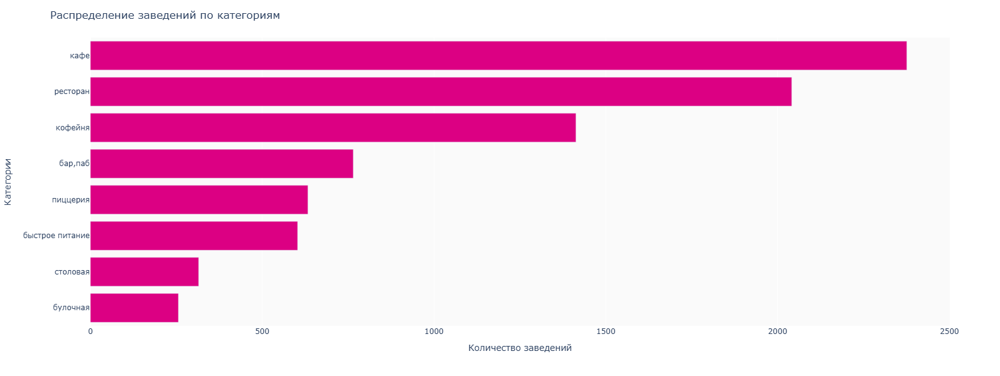

In [34]:
fig = px.bar(df_pie,  x='name', y='category', color_discrete_sequence = ['#DC0083']) 
fig.update_layout(title='Распределение заведений по категориям', 
                  xaxis_title='Количество заведений',
                  yaxis_title='Категории',
                  width=850, 
                  
                  height=600,     plot_bgcolor='rgba(0,0,0,0.02)')

fig.show() 

Больше всего в Москве кафе, рестронаов и кофеен. Кафе - лидеры 2376. Это не удивляет. В категорию кафе или ресторана можно записать почти любое заведение. Даже пиццерия может быть рестораном. А вот ресторан пиццерией не всегда. 

Меньше всего в Москве столовых и булочных. Возможно, в категорию столовых в основом записывают пункты питания при бизнес-центрах и предприятиях. Не очень ясно, что подразумевает формат булочной. Возможно, заведения стараются не приписывать себя к булочным, чтобы не сужать интерес потенциальных посетителей. Вместо этого выбирают называться кофейней.

### Количество посадочных мест по категориям

In [35]:
df_seats_med = df.groupby(['category'], \
                        as_index = False)[['seats']].median().sort_values(by=['seats'], ascending = False)
df_seats_med

,category,seats
6,ресторан,86.0
0,"бар,паб",82.5
4,кофейня,80.0
7,столовая,75.5
2,быстрое питание,65.0
3,кафе,60.0
5,пиццерия,55.0
1,булочная,50.0


In [36]:
df_seats_mea = df.groupby(['category'], \
                        as_index = False)[['seats']].mean().sort_values(by=['seats'], ascending = False)
df_seats_mea

,category,seats
6,ресторан,108.284664
0,"бар,паб",108.213725
4,кофейня,96.582449
7,столовая,88.125397
2,быстрое питание,84.615257
5,пиццерия,81.642970
3,кафе,79.138889
1,булочная,72.769531


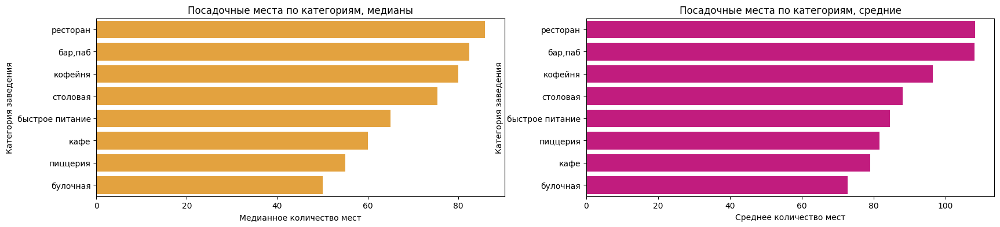

In [37]:
plt.figure(figsize=(20, 4))
plt.subplot(1, 2, 1)
sns.barplot(x='seats', y='category', data=df_seats_med, color='#FFA823')
plt.title('Посадочные места по категориям, медианы')
plt.xlabel('Медианное количество мест')
plt.ylabel('Категория заведения')
 
 

plt.subplot(1, 2, 2)
sns.barplot(x='seats', y='category', data=df_seats_mea, color='#DC0083')
plt.title('Посадочные места по категориям, средние')
plt.xlabel('Среднее количество мест')
plt.ylabel('Категория заведения')
 
 
plt.show()

- Лидируют рестораны и бары/пабы - 88-82.5 мест по медиане
- Меньше всего мест в пиццериях и булочных - 50-55 мест по медиане.

In [38]:
df.query('category == "кафе"')['seats'].describe()

count    2376.000000
mean       79.138889
std        86.421694
min         0.000000
25%        60.000000
50%        60.000000
75%        60.000000
max      1288.000000
Name: seats, dtype: float64

Максимальное количество мест 1288. Это значение в 15 раз выше среднего. Кажется, имею место выбросы. Для начала разберемся, в каких заведениях количество мест 1288

In [39]:
df.query('seats == 1288') 

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
6518,delonixcafe,ресторан,"москва, проспект вернадского, 94, корп. 1",Западный административный округ,"ежедневно, круглосуточно",55.652577,37.475730,4.1,высокие,Средний счёт:1500–2000 ₽,1750.0,140.0,0,1288.0,проспект вернадского,True
6524,ян примус,ресторан,"москва, проспект вернадского, 121, корп. 1",Западный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–02:00; вс 12:00...",55.657166,37.481519,4.5,выше среднего,Средний счёт:1500 ₽,1500.0,140.0,1,1288.0,проспект вернадского,False
6574,мюнгер,пиццерия,"москва, проспект вернадского, 97, корп. 1",Западный административный округ,"пн-пт 08:00–21:00; сб,вс 10:00–21:00",55.667505,37.491001,4.8,0,0,600.0,150.0,1,1288.0,проспект вернадского,False
6641,one price coffee,кофейня,"москва, проспект вернадского, 84, стр. 1",Западный административный округ,"ежедневно, 08:30–20:00",55.665129,37.478635,4.3,0,0,400.0,170.0,1,1288.0,проспект вернадского,False
6658,гудбар,"бар,паб","москва, проспект вернадского, 97, корп. 1",Западный административный округ,"пн-пт 11:00–23:00; сб,вс 13:00–23:00",55.667327,37.490601,4.1,средние,Средний счёт:700 ₽,700.0,202.5,0,1288.0,проспект вернадского,False
6684,пивной ресторан,"бар,паб","москва, проспект вернадского, 121, корп. 1",Западный административный округ,0,55.657133,37.481508,4.5,0,0,1250.0,202.5,0,1288.0,проспект вернадского,False
6690,японская кухня,ресторан,"москва, проспект вернадского, 121, корп. 1",Западный административный округ,0,55.657255,37.481547,4.4,0,0,1250.0,140.0,1,1288.0,проспект вернадского,False
6771,точка,кафе,"москва, проспект вернадского, 84, стр. 1",Западный административный округ,0,55.665634,37.477830,4.7,0,0,550.0,111.0,1,1288.0,проспект вернадского,False
6807,loft-cafe академия,кафе,"москва, проспект вернадского, 84, стр. 1",Западный административный округ,пн-пт 09:00–20:00; сб 09:00–16:00,55.665142,37.478603,3.6,0,0,550.0,111.0,0,1288.0,проспект вернадского,False
6808,яндекс лавка,ресторан,"москва, проспект вернадского, 51, стр. 1",Западный административный округ,"ежедневно, круглосуточно",55.672580,37.507753,4.0,0,0,1250.0,140.0,1,1288.0,проспект вернадского,True


1288 посадочных мест в нескольких заведениях на проспекте Вернадского. Проверка в гугле нескольких заведений из этого списка, показала, что эти кафе и рестораны не настолько большие. Также провелили поиск самых больших по количеству мест заведений Москвы на данный момент (июль 2024). Обычно это заведения, где возможно провести банкет. Тогда посадочных мест в районе 500, но фуршет в том же самом заведении можно провести на примерно 1000 человек.
- 1288 посадочных мест в нескольких заведениях на пр. Вернадского - ошибка, можно заменить нулями или средними значаниями по категории
- нужно изучить датасет на предмет выбросов по количеству посадочных мест

In [40]:
median_seats = df['seats'].median()

In [41]:
df.loc[df['seats'] == 1288, 'seats'] = median_seats

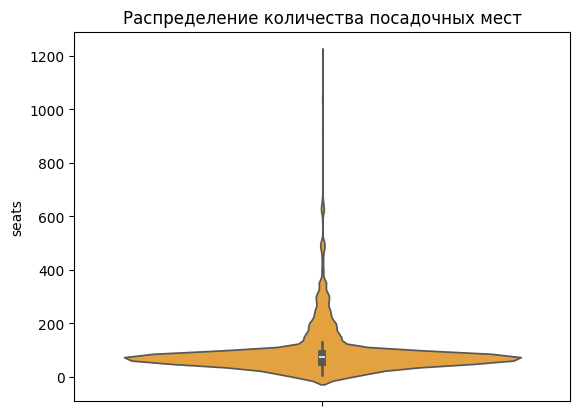

In [42]:
sns.violinplot(y='seats', data=df, color = '#FFA823')
plt.title('Распределение количества посадочных мест')
#plt.grid()
 
plt.show()

График показывает, что примерно после 200 мест начинаются выбросы.  

### Соотношение сетевых и несетевых заведений 

In [43]:
df_chain = df['chain'].value_counts().reset_index().rename(columns={'index':'chain'}).copy()

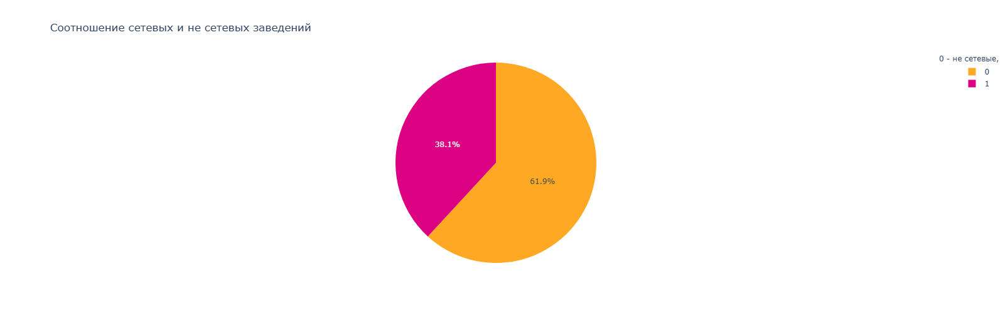

In [44]:
fig = go.Figure(data=[go.Pie(labels=df_chain['chain'], # указываем значения, которые появятся на метках сегментов
                             values=df_chain['count'], # указываем данные, которые отобразятся на графике
                             sort = True)])  
fig.update_layout(title='Соотношение сетевых и не сетевых заведений', # указываем заголовок графика
                  width=500, # указываем размеры графика
                  height=500,
                  annotations=[dict(x=1.12, # вручную настраиваем аннотацию легенды
                                    y=1.05,
                                    text='0 - не сетевые, 1 - сетевые',
                                    showarrow=False)])
fig.update_traces(marker=dict(colors=[ '#FFA823', '#DC0083']))
fig.show() # выводим график

Несетевых заведений почти 2/3, остальное - сетевые.

### Исследование сетевых заведений

In [45]:
df_cat_ch = df.groupby(['category', 'chain']).agg({'name':'count'}).sort_values(by = 'name', ascending = False).reset_index()
df_cat_ch

,category,chain,name
0,кафе,0,1597
1,ресторан,0,1311
2,кафе,1,779
3,ресторан,1,730
4,кофейня,1,720
5,кофейня,0,693
6,"бар,паб",0,596
7,быстрое питание,0,371
8,пиццерия,1,330
9,пиццерия,0,303


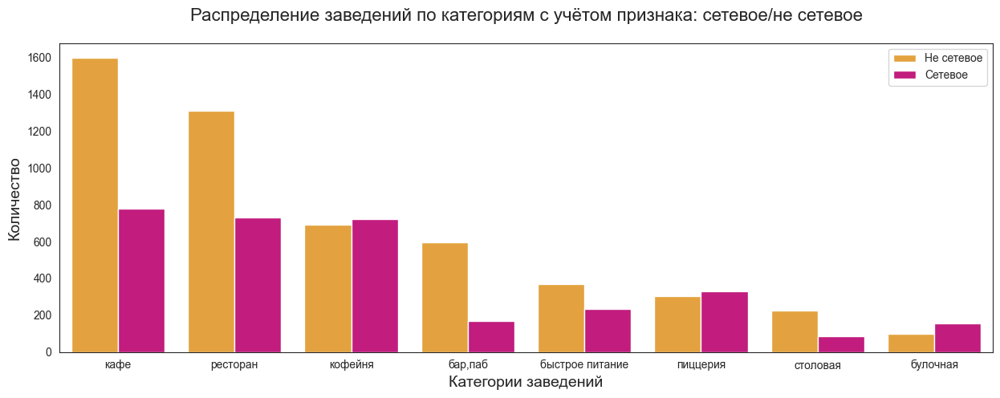

In [46]:
sns.set_style('white')
colors = ["#E3A5C7", "#694F8E"]
sns.set_palette(sns.color_palette(colors))
plt.figure(figsize=(15, 5))
 
ax = sns.barplot(x ='category', y = 'name', hue = 'chain' , data = df_cat_ch, palette = ['#FFA823','#DC0083'])
ax.legend_.remove()
handles, labels = ax.get_legend_handles_labels()
new_labels = ['Не сетевое', 'Сетевое']
legend = ax.legend(handles, new_labels)

plt.title('Распределение заведений по категориям с учётом признака: сетевое/не сетевое', size = 16, pad=20)
plt.xlabel('Категории заведений', size = 14)
plt.ylabel('Количество', size = 14)
 

plt.show()

Примерно одинаковое соотношение сетевых и несетевых заведений среди кофеен, пиццерий и булочных. В этих случаях не сетевых чуть меньше, чем сетевых. 
В остальных категориях не сетевые преобладают над сетевыми, в случае кафе и ресторанов - примерно в 2 раза. Возможно, дело в том, что  кафе и рестораны в принципе более популярные категории. 


Интересно посмотреть на соотношние сетевых и несетевых пунктов общественного питания в динамике. Мы владеем данными на лето 2022 года. Что было с данным соотношением до пандемии? Кажется, сетевые заведения должны были быть более устойчивыми к катаклизмам. Было ли до пандемии еще больше несетевых заведений или соотношение не менялось. Для подготовки отчета инвесторам фонда «Shut Up and Take My Money» было бы хорошо посмотреть данные за другие годы. В том числе, чтобы оценить, как ведет себя индустрия общепита в стрессовые времена. В какую сторону лучше смотреть: свое уникальное кафе или франшиза надежной сети.

### Топ-15 популярных сетей в Москве

In [47]:
df.head(1)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.47886,5.0,0,0,550.0,111.0,0,60.0,улица дыбенко,False


In [48]:
df_ch = (df.query('chain == 1').copy())

In [49]:
df_new = (df_ch.groupby(by = 'name').agg({'name':'count'}).rename(columns={'name':'count'}).sort_values(by = 'count', ascending = False).reset_index())
df_new = df_new.head(15)
df_new

,name,count
0,шоколадница,120
1,домино'с пицца,76
2,додо пицца,74
3,one price coffee,71
4,яндекс лавка,69
5,cofix,65
6,prime,50
7,хинкальная,44
8,кофепорт,42
9,кулинарная лавка братьев караваевых,39


In [50]:
name_top_list = df_new['name'].values.tolist()
name_top_list

['шоколадница',
 "домино'с пицца",
 'додо пицца',
 'one price coffee',
 'яндекс лавка',
 'cofix',
 'prime',
 'хинкальная',
 'кофепорт',
 'кулинарная лавка братьев караваевых',
 'теремок',
 'чайхана',
 'cofefest',
 'буханка',
 'му-му']

In [51]:
df_top_chain = df[['name', 'category']]
df_top_chain_1 = df_top_chain.loc[df_top_chain['name'].isin(name_top_list)]
df_top_chain_1

,name,category
13,буханка,булочная
23,буханка,булочная
32,додо пицца,пиццерия
34,домино'с пицца,пиццерия
46,cofefest,кофейня
...,...,...
7973,теремок,ресторан
7974,хинкальная,ресторан
7979,яндекс лавка,ресторан
7980,яндекс лавка,ресторан


In [52]:
df_new_new = (df_top_chain_1.groupby(by = ['name', 'category']).agg({'name':'count'})).rename(columns = {'name':'count'}).reset_index()
df_new_new = df_new_new.sort_values(by = 'count', ascending = False)

<Figure size 2000x2000 with 0 Axes>

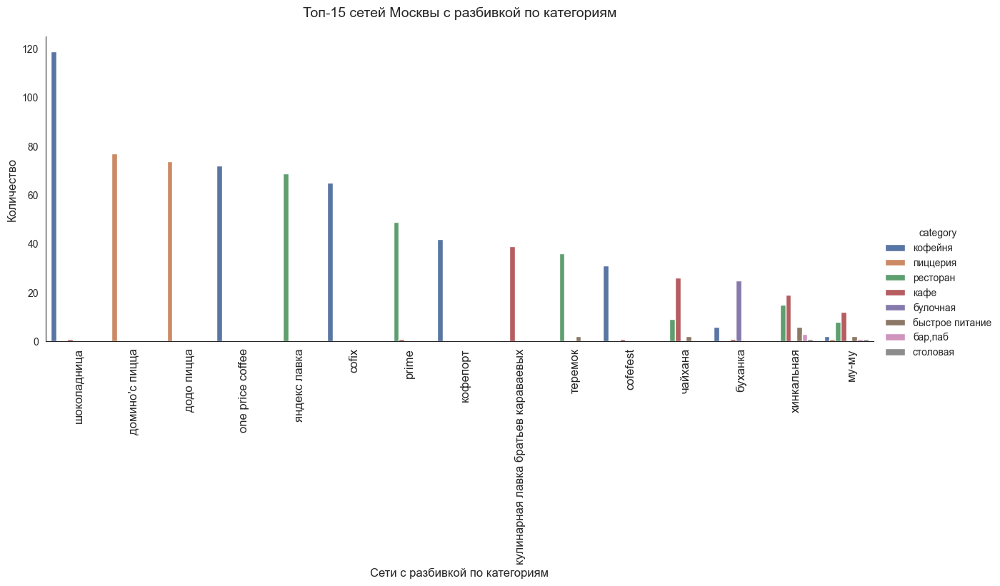

In [53]:
plt.figure(figsize=(20, 20))
sns.set_style('white') 
sns.set_palette('deep') 
ax = sns.catplot(
    data=df_new_new, x='name', y = 'count', hue='category', kind='bar', aspect=2.5)
 
ax.set_xticklabels(rotation=90, horizontalalignment='left', size=12);
ax.set_xlabels('Сети с разбивкой по категориям', size=12)
ax.set_ylabels('Количество', size=12)
plt.title('Топ-15 сетей Москвы с разбивкой по категориям', size = 14, pad=20)
plt.show()

Вывели 15 самых популярных (по количеству заведений) сетей питания Москвы.  На графике отразили разбивку по категориям. Больше всего кофеен. Также много пиццерий и ресторанов

Почти все названия знакомы. Была попытка вывести средний чек и среднюю стоимость чашки кофе. Но слишком мало информации заполнено, не получилось сделать вывода, какая ценовая категория преобладает в данном топе. 

Больше всего точек у Шоколадницы = 120, на следующем месте Домино'с Пицца уже только 76 заведений. Количество постепенно убывает вниз по шкале

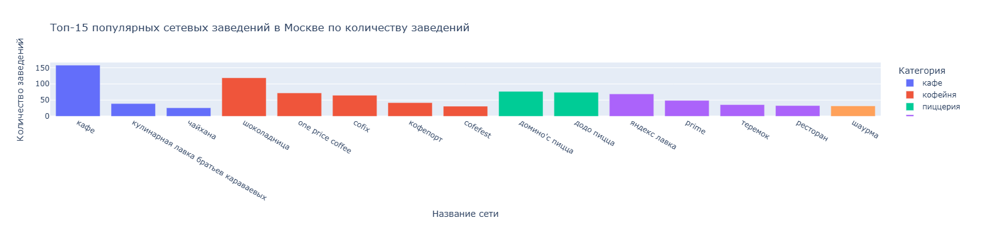

In [54]:
# Код ревьюера 

import pandas as pd
import plotly.express as px

# Группировка данных по названию сети и категории, подсчёт количества заведений в каждой группе
grouped_data = df.groupby(['name', 'category']).size().reset_index(name='count')

# Сортировка по количеству заведений и выбор топ-15
top_chains = grouped_data.sort_values(by='count', ascending=False).head(15)

# Построение графика
fig = px.bar(top_chains, x='name', y='count', color='category', title='Топ-15 популярных сетевых заведений в Москве по количеству заведений',
             labels={'count': 'Количество заведений', 'name': 'Название сети', 'category': 'Категория'})
fig.show()

### Анализ по административным округам

In [55]:
df_distr_1 = df.groupby(['category','district']).agg({'name' : 'count'}).reset_index().rename(columns = {'name':'count'})
df_distr_1

,category,district,count
0,"бар,паб",Восточный административный округ,53
1,"бар,паб",Западный административный округ,50
2,"бар,паб",Северный административный округ,68
3,"бар,паб",Северо-Восточный административный округ,63
4,"бар,паб",Северо-Западный административный округ,23
...,...,...,...
67,столовая,Северо-Западный административный округ,18
68,столовая,Центральный административный округ,66
69,столовая,Юго-Восточный административный округ,25
70,столовая,Юго-Западный административный округ,17


In [56]:
df_distr_2 = df.groupby(['district']).agg({'name' : 'count'}).sort_values(by = 'name', ascending = False)
df_distr_2

,name
district,
Центральный административный округ,2242
Северный административный округ,898
Южный административный округ,892
Северо-Восточный административный округ,890
Западный административный округ,850
Восточный административный округ,798
Юго-Восточный административный округ,714
Юго-Западный административный округ,709
Северо-Западный административный округ,409


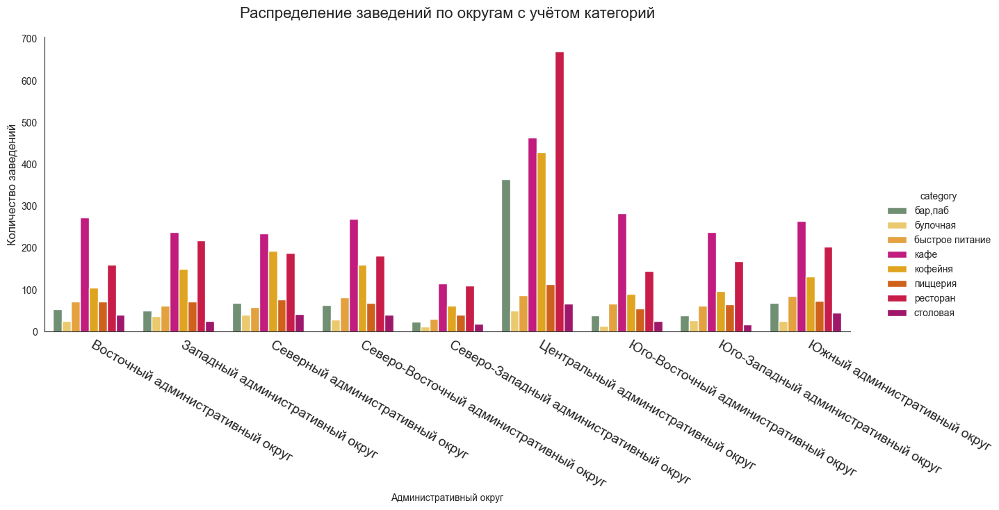

In [57]:
sns.set_style('white') 
sns.set_palette('deep') 
ax = sns.catplot(
    data=df_distr_1, x='district', y='count', hue='category', kind='bar', aspect=2.5, palette = ['#6C946F', '#FFD35A', '#FFA823', '#DC0083', '#FFB200', '#EB5B00', '#E4003A', '#B60071'])
 
ax.set_xticklabels(rotation=-30, horizontalalignment='left', size=14);
ax.set_xlabels('Административный округ', size=10)
ax.set_ylabels('Количество заведений', size=12)
plt.title('Распределение заведений по округам с учётом категорий', size = 16, pad=20)
plt.show()

Больше всего точек питания в Центральном округе = 2242. В центре больше кафе и ресторанов, нацеленных на туристов, а также кафе для перерывов на обед, людей, который там работают. Кроме того, люди из спальных районов выбираются в центр города в качестве отдыха. 

В остальных районах количество заведений примерно одинаковое (от 709 до 900). За исключением Северо-Западного округа, в котором 409 заведений. Гугл говорит, что Северо-Западный округ меньша остальных по площади, возможно, дело в этом.

На столбчатой диаграмме представлено распределение категорий по районам. 
- В Центральном р-не лидируют рестораны. Далее идут кафе, кофейни и бары
- В остальных районах лидируют кафе. Далее идут рестораны и кофейни

### Распределение средних рейтингов по категориям заведений

In [58]:
df_rat = (df.groupby('category').agg({'rating':'mean'}).sort_values(by = 'rating', ascending = False).reset_index())
df_rat

,category,rating
0,"бар,паб",4.387712
1,пиццерия,4.301264
2,ресторан,4.290348
3,кофейня,4.277282
4,булочная,4.268359
5,столовая,4.211429
6,кафе,4.124285
7,быстрое питание,4.050249


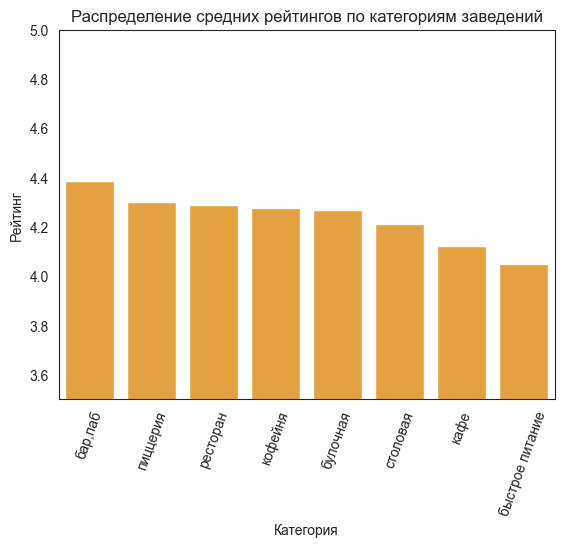

In [59]:
ax = sns.barplot(x='category',
            y='rating',
            data=df_rat,
            color = '#FFA823')
 
plt.xticks(rotation=70)
ax.set_title('Распределение средних рейтингов по категориям заведений')
ax.set(xlabel='Категория', ylabel='Рейтинг')
ax.set_ylim(3.5, 5)
plt.show()

Средние рейтинги заведений по категориям колеблятся от 4.05 - быстрое питание до 4.39 - бар, паб. Возможно, барам ставят более высокие оценки, т к люди в них больше выпивают. Быстрое питание направлено на утоление голода без длительного ожидания. Во-первых, в час пик, в фаст фуде все равно очереди и люди раздражаются, что их план быстро поесть не оправдался. Во-вторых, качество еды при потоковом быстром изготовлении также должно страдать.

Также низкий рейтинг у кафе = 4.12. Кафе в принципе больше, чем других категорий. 

На столбчатой диаграмме разница в рейтингах почти не заметна

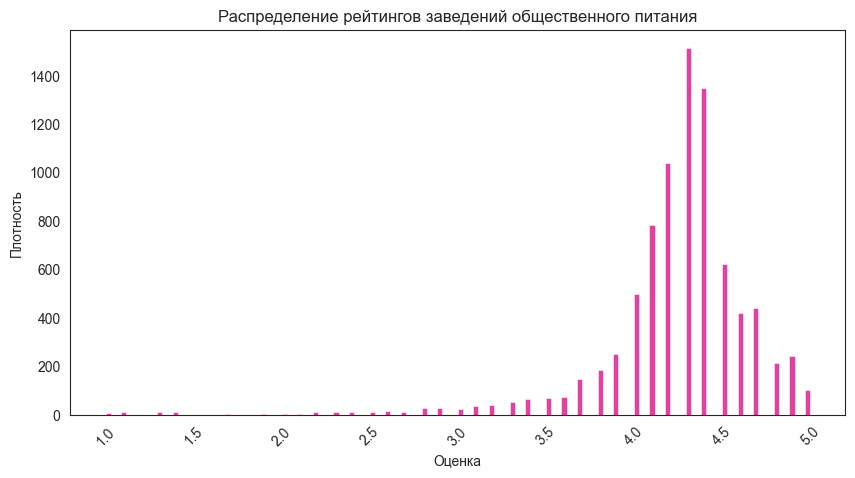

In [60]:
plt.figure(figsize=(10, 5))
 
sns.histplot(x='rating', data=df, color = '#DC0083')
plt.xticks(rotation=45)
plt.title('Распределение рейтингов заведений общественного питания')
plt.xlabel('Оценка')
plt.ylabel('Плотность')
plt.show()

Также построили гистограмму оценок (без разбиения на категории). Хвост гистограммы вытянулся влево, где располагается небольшое количество низких оценок. Пик в районе 4.3. В основном ставятся оценки от 3.5 до 5.0. 

### Фоновая картограмма (хороплет) со средним рейтингом заведений каждого района

In [61]:
df_distr_rat = (df.groupby('district').agg({'rating':'mean'}).reset_index().sort_values(by = 'rating', ascending = False))
df_distr_rat['rating'] = round(df_distr_rat['rating'], 2)
df_distr_rat

,district,rating
5,Центральный административный округ,4.38
2,Северный административный округ,4.24
4,Северо-Западный административный округ,4.21
8,Южный административный округ,4.18
1,Западный административный округ,4.18
0,Восточный административный округ,4.17
7,Юго-Западный административный округ,4.17
3,Северо-Восточный административный округ,4.15
6,Юго-Восточный административный округ,4.10


In [62]:
try:
    with open(r"D:\Проекты Яндекс.Практикум\DA\04 Как рассказать историю с помощью данных\admin_level_geomap.geojson", encoding='utf-8') as f: geo = json.load(f)
except: 
    with open('/datasets/admin_level_geomap.geojson', encoding='utf-8') as f: geo = json.load(f)

In [63]:
moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

Choropleth(
    geo_data=geo,
    data=df_distr_rat,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color = 'PuRd',
    fill_opacity=0.9,
    legend_name='Cредний рейтинг заведений по районам',
).add_to(m)

folium.GeoJson(
    geo,
    style_function=lambda feature: {
        'fillColor': '#ffffff00',
        'color': '#000000',
        'weight': 0.6,
        'dashArray': '5, 5'
    },
    tooltip=folium.GeoJsonTooltip(
        fields=['name'],  # Имя поля в geojson файле, которое содержит название региона
        localize=True
    )
).add_to(m)


# выводим карту
m

Самый высокий средний рейтинг заведений в Центральном округе Москвы = 4.38

Самый низкий рейтинг в Юго-Восточном округе = 4.1

### Отображение всех заведений датасета на карте с помощью кластеров

In [64]:
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df.apply(create_clusters, axis=1)

# выводим карту
m

При наиболее отдаленном масштабе видно, что больше всего заведений на север и в центре, меньше всего на юге. В целом точки питания распределены по карте равномерно. Чаще вдоль дорог. В центре плотность выше.

### Топ-15 улиц по количеству заведений

In [65]:
df_str = (df.groupby(by = 'street').agg({'name':'count'}).sort_values(by = 'name', ascending = False).reset_index().rename(columns = {'name':'count'}).head(15))
df_str

,street,count
0,проспект мира,183
1,профсоюзная улица,122
2,проспект вернадского,108
3,ленинский проспект,107
4,ленинградский проспект,95
5,дмитровское шоссе,88
6,каширское шоссе,77
7,варшавское шоссе,76
8,ленинградское шоссе,70
9,мкад,65


In [66]:
name_list = df_str['street'].values.tolist()
name_list

['проспект мира',
 'профсоюзная улица',
 'проспект вернадского',
 'ленинский проспект',
 'ленинградский проспект',
 'дмитровское шоссе',
 'каширское шоссе',
 'варшавское шоссе',
 'ленинградское шоссе',
 'мкад',
 'люблинская улица',
 'улица вавилова',
 'кутузовский проспект',
 'улица миклухо-маклая',
 'пятницкая улица']

In [67]:
df_str_new = df[['name', 'category', 'street']]
df_str_new

,name,category,street
0,wowфли,кафе,улица дыбенко
1,четыре комнаты,ресторан,улица дыбенко
2,хазри,кафе,клязьминская улица
3,dormouse coffee shop,кофейня,улица маршала федоренко
4,иль марко,пиццерия,правобережная улица
...,...,...,...
8401,суши мания,кафе,профсоюзная улица
8402,миславнес,кафе,пролетарский проспект
8403,самовар,кафе,люблинская улица
8404,чайхана sabr,кафе,люблинская улица


In [68]:
df_str_new_1 = df_str_new.loc[df_str_new['street'].isin(name_list)]

In [69]:
df_str_new_1

,name,category,street
8,donna maria,ресторан,дмитровское шоссе
12,заправка,кафе,мкад
17,чайхана беш-бармак,ресторан,ленинградское шоссе
26,пикочино,пиццерия,дмитровское шоссе
28,mafe,кафе,мкад
...,...,...,...
8356,назис пури,кофейня,люблинская улица
8396,пекинский двор,ресторан,ленинский проспект
8401,суши мания,кафе,профсоюзная улица
8403,самовар,кафе,люблинская улица


In [70]:
df_str_new_1 = df_str_new_1.pivot_table(index = 'street', columns = 'category', values = 'name', aggfunc = 'count') 
df_str_new_1 = df_str_new_1.fillna(0)
df_str_new_1['sum'] =  df_str_new_1['бар,паб'] + df_str_new_1['булочная'] + df_str_new_1['быстрое питание'] + df_str_new_1['кафе'] + df_str_new_1['кофейня']+df_str_new_1['пиццерия'] + df_str_new_1['ресторан'] + df_str_new_1['столовая']
df_str_new_1 = df_str_new_1.sort_values(by = 'sum', ascending = False)
df_str_new_1
 

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,sum
street,,,,,,,,,
проспект мира,12.0,4.0,21.0,53.0,36.0,11.0,44.0,2.0,183.0
профсоюзная улица,6.0,4.0,15.0,35.0,18.0,15.0,26.0,3.0,122.0
проспект вернадского,7.0,1.0,12.0,25.0,16.0,12.0,33.0,2.0,108.0
ленинский проспект,10.0,3.0,2.0,26.0,23.0,5.0,33.0,5.0,107.0
ленинградский проспект,15.0,4.0,2.0,12.0,25.0,9.0,25.0,3.0,95.0
дмитровское шоссе,6.0,2.0,10.0,23.0,11.0,8.0,24.0,4.0,88.0
каширское шоссе,2.0,0.0,10.0,20.0,16.0,5.0,19.0,5.0,77.0
варшавское шоссе,6.0,0.0,7.0,18.0,14.0,4.0,20.0,7.0,76.0
ленинградское шоссе,5.0,2.0,5.0,13.0,13.0,3.0,26.0,3.0,70.0


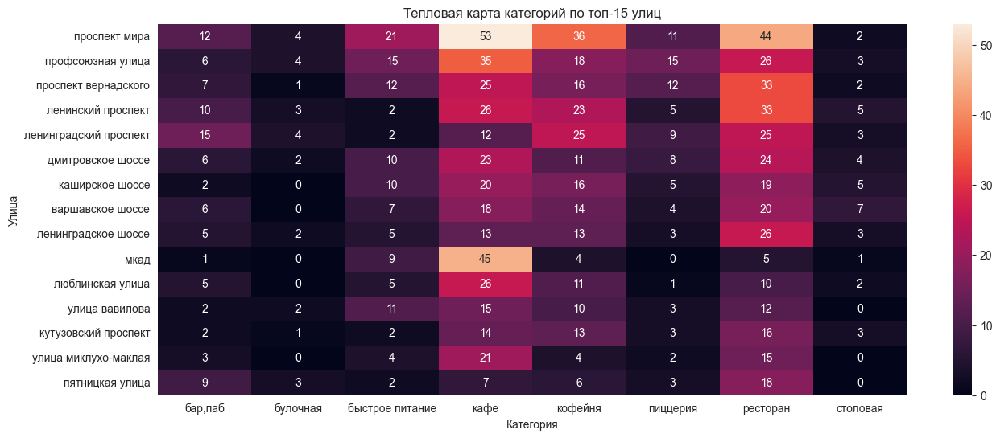

In [71]:
plt.figure(figsize = (15, 6))
sns.heatmap(
    df_str_new_1.drop(columns=['sum']),  
    annot=True
    
  
)
 
plt.title('Тепловая карта категорий по топ-15 улиц') # название графика
plt.xlabel('Категория')
plt.ylabel('Улица')
plt.show()

Вывели топ-15 улиц Москвы по количеству заведений. Это в том числе и очень длинные улицы. Даже по названиям видно: МКАД, несколько шоссе, проспекты.

За исключением Пятницкой, которая находится внутри Садового кольца и, вероятно, считается "тусовочной". 

Не выглядит слишком протяженной улица Миклухо-Маклая. Возможно, на ней находятся торговые центры, в которых скапливаются различные кафе. 

Также построили хитмеп топ-15 улиц по категориям. Самые светлые квадратики показывают наибольшее количество заведений. Так, например, видно, что на МКАД много кафе, но совсем нет булочных. А больше всего кафе на проспекте Мира

### Улицы, на которых находится только один объект общепита

In [72]:
df_str_1 = (df.groupby(by = 'street').agg({'name':'count'}).sort_values(by = 'name', ascending = True).reset_index().rename(columns = {'name':'count'}))
df_str_1 = df_str_1.loc[((df_str_1['count'] == 1))]
name_list = df_str_1['street'].values.tolist()
df_str_1 = df.loc[df['street'].isin(name_list)]
df_str_1

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
15,дом обеда,столовая,"москва, улица бусиновская горка, 2",Северный административный округ,пн-пт 08:30–18:30; сб 10:00–20:00,55.885890,37.493264,4.1,средние,Средний счёт:300–500 ₽,400.0,140.0,0,180.0,улица бусиновская горка,False
21,7/12,кафе,"москва, прибрежный проезд, 7",Северный административный округ,"ежедневно, 10:00–22:00",55.876805,37.464934,4.5,0,0,550.0,111.0,0,60.0,прибрежный проезд,False
25,в парке вкуснее,кофейня,"москва, парк левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,0,0,400.0,170.0,1,80.0,парк левобережный,False
58,coffeekaldi's,кофейня,"москва, угличская улица, 13, стр. 8",Северо-Восточный административный округ,"ежедневно, 09:00–22:00",55.900316,37.570558,4.1,средние,Средний счёт:500–800 ₽,650.0,170.0,1,80.0,угличская улица,False
60,чебуречная история,кофейня,"москва, ландшафтный заказник лианозовский",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.899845,37.570488,4.9,0,0,400.0,170.0,1,80.0,ландшафтный заказник лианозовский,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8289,мираж,ресторан,"москва, улица шкулёва, 2а",Юго-Восточный административный округ,"пн-пт 11:00–23:00; сб,вс 11:00–00:00",55.693340,37.746231,4.7,0,0,1250.0,140.0,0,90.0,улица шкулёва,False
8294,wtfcoffee,кофейня,"москва, улица артюхиной, 14/8с1",Юго-Восточный административный округ,"ежедневно, 10:00–22:00",55.699044,37.737790,4.4,средние,0,400.0,170.0,0,80.0,улица артюхиной,False
8317,беседка,кафе,"москва, кузьминская улица, 10",Юго-Восточный административный округ,"ежедневно, 11:00–23:00",55.690691,37.787735,4.1,0,0,550.0,111.0,1,60.0,кузьминская улица,False
8379,лагман хаус,кафе,"москва, новороссийская улица, 14, стр. 2",Юго-Восточный административный округ,"ежедневно, 10:00–00:00",55.678772,37.759422,4.3,0,0,550.0,111.0,1,40.0,новороссийская улица,False


In [73]:
df_str_1.groupby('category').agg({'name':'count'}).sort_values(by ='name', ascending=False)

,name
category,
кафе,159
ресторан,93
кофейня,84
"бар,паб",39
столовая,36
быстрое питание,23
пиццерия,15
булочная,8


In [74]:
df_str_1.groupby('district').agg({'name':'count'}).sort_values(by ='name', ascending=False)

,name
district,
Центральный административный округ,145
Северо-Восточный административный округ,55
Восточный административный округ,52
Северный административный округ,51
Южный административный округ,43
Юго-Восточный административный округ,39
Западный административный округ,35
Северо-Западный административный округ,19
Юго-Западный административный округ,18


In [75]:
df_str_1.groupby('is_24_7').agg({'name':'count'}).sort_values(by ='name', ascending=False)

,name
is_24_7,
False,426
True,31


Обнаружено 457 улиц, на которых находится только один объект общепита. Сгруппировали их по категориям, административных округам и режиму работы. Единственное, заметное отличие, что среди 457 заведений, только 427 работают круглосуточно и ежедневно. Вероятно, в непопулярых местах - нет нужны в круглосуточных точка питания. Выборочная проверка нескольких улиц на картах в интернете, показала, что они короткие. Также бросаются в глаза названия: проезды, бульвары, парки. Проезды и бульвары, могут не быть протяженными. В парках, действительно, может быть 1-2 кафе или лоток с мороженным.

### Хороплет с медианными значениями средних чеков по районам

In [76]:
df_bill_med = (df.groupby(by = 'district').agg({'middle_avg_bill':'median'}).sort_values(by = 'middle_avg_bill', ascending = False).reset_index())
df_bill_med

,district,middle_avg_bill
0,Центральный административный округ,750.0
1,Восточный административный округ,550.0
2,Западный административный округ,550.0
3,Северный административный округ,550.0
4,Северо-Восточный административный округ,550.0
5,Северо-Западный административный округ,550.0
6,Юго-Восточный административный округ,550.0
7,Юго-Западный административный округ,550.0
8,Южный административный округ,550.0


In [77]:
df_bill_mean = (df.groupby(by = 'district').agg({'middle_avg_bill':'mean'}).sort_values(by = 'middle_avg_bill', ascending = False).reset_index())
df_bill_mean

,district,middle_avg_bill
0,Центральный административный округ,965.798840
1,Западный административный округ,806.396471
2,Северо-Западный административный округ,744.594132
3,Северный административный округ,737.336303
4,Южный административный округ,736.436099
5,Юго-Западный административный округ,705.926657
6,Восточный административный округ,704.527569
7,Северо-Восточный административный округ,673.904494
8,Юго-Восточный административный округ,662.808123


Так как пропуски были заполнены медианами, разница медианных значений по округам отсутствует. У Центрального округа значение = 750, у остальных округов по 550.

Больше заметны различия на средних показанятелях.

Самые высокие цены (как и рейтинги, как и количество точек) в Центральном округе = 966. Самый низкий чек (как и рейтинг) в Юго-Восточном округе = 663.

In [78]:
try:
    with open(r"D:\Проекты Яндекс.Практикум\DA\04 Как рассказать историю с помощью данных\admin_level_geomap.geojson", encoding='utf-8') as f: geo = json.load(f)
except: 
    with open('/datasets/admin_level_geomap.geojson', encoding='utf-8') as f: geo = json.load(f)

In [79]:
moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

Choropleth(
    geo_data=geo,
    data=df_bill_mean,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='PuRd',
    fill_opacity=0.9,
    legend_name='Cредний чек по районам',
).add_to(m)


folium.GeoJson(
    geo,
    style_function=lambda feature: {
        'fillColor': '#ffffff00',
        'color': '#000000',
        'weight': 0.5,
        'dashArray': '5, 5'
    },
    tooltip=folium.GeoJsonTooltip(
        fields=['name'],  # Имя поля в geojson файле, которое содержит название региона
        localize=True
    )
).add_to(m)

# выводим карту
m

Округа Москвы выглядят на карте достаточно равномерно. Центр и лепестки, как у ромашки. Западный округ включает в себя некоторые отдаленные территории и ближе всех к ценам Центрального округа. Возможно, Западный округ включает в себя районы с дорогостоящим жильем и важными объектами. Бросается в глаза МГУ, а также близость к границе с Москва-Сити. 

Низкий чек в Северо-Восточном, Восточном, Юго-Восточном, Юго-Западном. Похоже, это спальные "небогатые" районы Москвы. Было бы неплохо иметь данные о плотности населения на лето 2022. А также представление о количестве бизнес-центров и производств, которые могут служить источником посетителей для общепита.

### Вывод по итогам анализа

В датасете представлены категории заведений:

- кафе = 2378
- ресторан = 2043
- кофейня = 1413
- бар,паб = 765
- пиццерия = 633
- быстрое питание = 603
- столовая = 315
- булочная = 256

Медианное количество посадочных мест:

- ресторан = 86.0
- бар,паб = 82.5
- кофейня = 80.0
- столовая = 75.5
- быст = 60.0
- пиццерия = 55.0
- булочная = 50.0

Соотношение сетевых и несетевых заведений:
- не сетевые = 61.9%
- сетевые  = 38.1%

Примерно одинаковое соотношение сетевых и несетевых заведений среди кофеен, пиццерий и булочных. Во этих случаях не сетевых чуть меньше, чем сетевых. 
В остальных категориях не сетевые преобладают над сетевыми, в случае кафе и ресторанов - примерно в 2 раза

Топ-15 популярных сетей:

- Шоколадница = 120 
- Домино'с Пицца = 76 
- Додо Пицца = 74
- One Price Coffee = 71 
- Яндекс Лавка = 69 
- Cofix = 65 
- Prime = 50 
- Хинкальная = 44 
- КОФЕПОРТ = 42
- Кулинарная лавка братьев Караваевых = 39 
- Теремок = 38 
- Чайхана = 37 
- CofeFest = 32 
- Буханка = 32 
- Му-Му = 27
Больше всего среди топ-15 сетей - кофеен.

Количество точек питания по административным округам:
 
- Центральный административный округ = 2242
- Северный административный округ = 900
- Южный административный округ = 892
- Северо-Восточный административный округ = 891
- Западный административный округ = 851
- Восточный административный округ = 798
- Юго-Восточный административный округ = 714
- Юго-Западный административный округ = 709
- Северо-Западный административный округ = 409

Средний рейтинг по категориям:

- бар,паб = 4.387712
- пиццерия = 4.301264
- ресторан = 4.290357
- кофейня = 4.277282
- булочная = 4.268359
- столовая = 4.211429
- кафе = 4.123886
- быстрое питание = 4.050249

Средний рейтинг по районам:

- Центральный административный округ = 4.38
- Северный административный округ = 4.24
- Северо-Западный административный округ = 4.21
- Южный административный округ = 4.18
- Западный административный округ = 4.18
- Восточный административный округ = 4.17
- Юго-Западный административный округ = 4.17
- Северо-Восточный административный округ = 4.15
- Юго-Восточный административный округ = 4.10

Топ-15 улиц по количеству заведений:

- проспект Мира = 184
- Профсоюзная улица = 122
- проспект Вернадского = 108
- Ленинский проспект = 107
- Ленинградский проспект = 95
- Дмитровское шоссе = 88
- Каширское шоссе = 77
- Варшавское шоссе = 76
- Ленинградское шоссе = 70
- МКАД = 65
- Люблинская улица = 60
- улица Вавилова = 55
- Кутузовский проспект = 54
- улица Миклухо-Маклая = 49
- Пятницкая улица = 48

Обнаружено 457 улиц, на которых находится только один объект общепита. Распределение по районам:

- Центральный административный округ = 145
- Северо-Восточный административный округ = 55
- Восточный административный округ = 52
- Северный административный округ = 52
- Южный административный округ = 43
- Юго-Восточный административный округ = 39
- Западный административный округ = 35
- Северо-Западный административный округ = 19
- Юго-Западный административный округ = 18

Среднее значения чека по округам:

- Центральный административный округ = 966
- Западный административный округ = 806 
- Северо-Западный административный округ = 745
- Северный административный округ = 737 
- Южный административный округ = 736 
- Юго-Западный административный округ = 706
- Восточный административный округ = 705
- Северо-Восточный административный округ = 674
- Юго-Восточный административный округ = 663

В датасета представлено достаточно заведений для анализа. К сожалению, у большинства не указано количество посадочных мест и средний чек. Также не хватает информации о стоимости аренды (по районам или улицам) для простейшей оценки маржинальности. 


## Открытие кофейни

In [80]:
df_cofe = df.query('category == "кофейня"')
print('Количество кофеен в датасете:', df_cofe.shape[0])

Количество кофеен в датасете: 1413


### Выбор района

In [81]:
df_cofe.groupby(by = 'district').agg({'name':'count'}).sort_values(by = 'name', ascending = False).reset_index()

,district,name
0,Центральный административный округ,428
1,Северный административный округ,193
2,Северо-Восточный административный округ,159
3,Западный административный округ,150
4,Южный административный округ,131
5,Восточный административный округ,105
6,Юго-Западный административный округ,96
7,Юго-Восточный административный округ,89
8,Северо-Западный административный округ,62


In [82]:
df_cofe_bill_mean = (df_cofe.groupby(by = 'district').agg({'middle_coffee_cup':'mean'}).sort_values(by = 'middle_coffee_cup', ascending = False))
df_cofe_bill_mean = df_cofe_bill_mean.reset_index()
df_cofe_bill_mean

,district,middle_coffee_cup
0,Центральный административный округ,176.630841
1,Западный административный округ,176.513333
2,Юго-Западный административный округ,175.020833
3,Восточный административный округ,171.609524
4,Северо-Западный административный округ,168.483871
5,Северный административный округ,168.341969
6,Северо-Восточный административный округ,168.238994
7,Южный административный округ,166.221374
8,Юго-Восточный административный округ,162.775281


In [83]:
df_cofe_bill_med  = (df_cofe.groupby(by = 'district').agg({'middle_coffee_cup':'median'}).sort_values(by = 'middle_coffee_cup', ascending = False)\
                           .reset_index().rename(columns={'middle_coffee_cup':'median_coffee_cup'}))
df_cofe_bill_med 

,district,median_coffee_cup
0,Восточный административный округ,170.0
1,Западный административный округ,170.0
2,Северный административный округ,170.0
3,Северо-Восточный административный округ,170.0
4,Северо-Западный административный округ,170.0
5,Центральный административный округ,170.0
6,Юго-Восточный административный округ,170.0
7,Юго-Западный административный округ,170.0
8,Южный административный округ,170.0


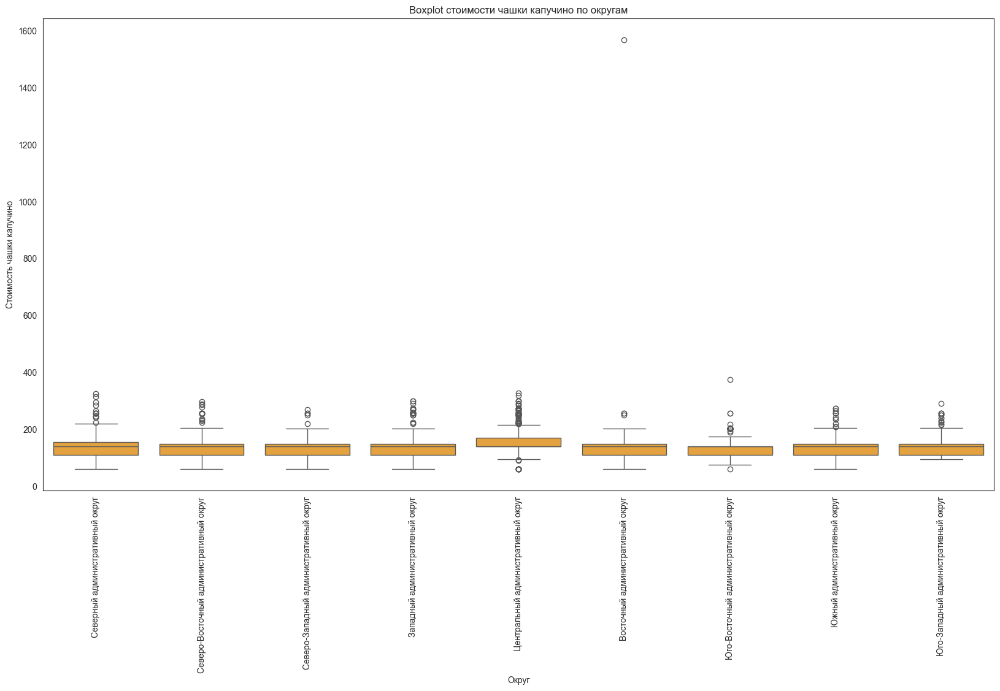

In [84]:
plt.figure(figsize=(20, 10))
ax = sns.boxplot(x = 'district', y = 'middle_coffee_cup', data = df, color = '#FFA823')
 
plt.title('Boxplot стоимости чашки капучино по округам')
plt.xlabel('Округ')
plt.ylabel('Стоимость чашки капучино')
plt.xticks(rotation=90)

plt.show()

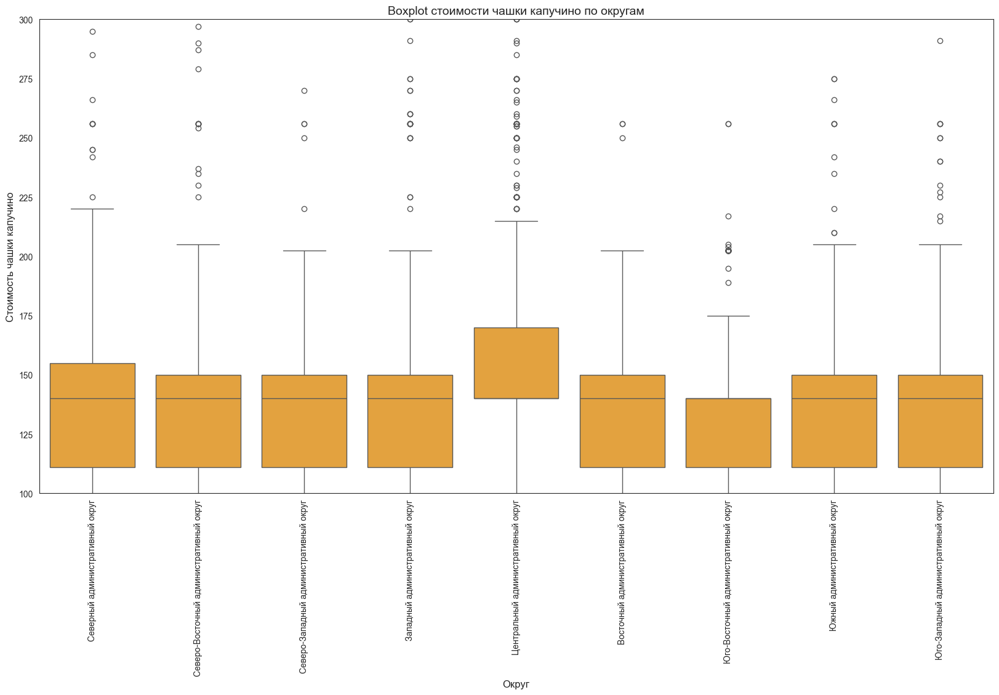

In [85]:
plt.figure(figsize=(20, 10))
ax = sns.boxplot(x = 'district', y = 'middle_coffee_cup', data = df, color = '#FFA823')
 
plt.title('Boxplot стоимости чашки капучино по округам', size = 14)
plt.xlabel('Округ', size = 12)
plt.ylabel('Стоимость чашки капучино', size = 12)
plt.xticks(rotation=90)
ax.set_ylim(100, 300)
plt.show()

In [86]:
moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

Choropleth(
    geo_data=geo,
    data=df_cofe_bill_mean,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='PuRd',
    fill_opacity=0.9,
    legend_name='Cредняя стоиость чашки капучино по районам',
).add_to(m)


folium.GeoJson(
    geo,
    style_function=lambda feature: {
        'fillColor': '#ffffff00',
        'color': '#000000',
        'weight': 0.5,
        'dashArray': '5, 5'
    },
    tooltip=folium.GeoJsonTooltip(
        fields=['name'],  # Имя поля в geojson файле, которое содержит название региона
        localize=True
    )
).add_to(m)

# выводим карту
m

Попробуем выбрать район размещения кофейни по средней стоимости чашки капучино.  

Было бы более информативно провести сравнение средний стоимости чашки кофе и средней стоимости 1 квадратного метра аренды по округам. Информации о стоимости аренды нет, поэтому опираемся только на стоимость кофе.

Построили boxplot стоимости кофе по округам. 

Средние цены практически одинаковые во всем районам. Заментно, что Юго-Восточном округе цена ниже. В Ценральном, Западном и Юго-Западном выше
 
Допустим, кофейня будет приносить прибыль и инвесторы задумают открыть вторую. Если вторая кофейня будет находиться хотя бы в одном направлении, это позволит сэкономить на логистике.  

Для открытия кофейни можно рассматривать любой из районов кроме Юго-Восточного. Стоит понимать, что в Центральном округе высокая стоимость аренды и высокая конкуренция. Одновременно, с этим  улицы с высокой походимостью могут обеспечить снижение расходов на единицу продукции. 

### Режим работы

In [87]:
df_cofe.groupby(by = 'is_24_7').agg({'name':'count'}).sort_values(by = 'name', ascending = False).reset_index()

,is_24_7,name
0,False,1354
1,True,59


In [88]:
df_cofe_schedule = (df_cofe.pivot_table(index='district', columns = 'is_24_7', values = 'name', aggfunc = 'count').reset_index())
df_cofe_schedule.columns = [ 'district', 'Не 24/7', '24/7']
df_cofe_schedule['rat'] = round(df_cofe_schedule['24/7']/(df_cofe_schedule['24/7'] + df_cofe_schedule['Не 24/7']),2)
df_cofe_schedule.sort_values(by = 'rat', ascending = False)

,district,Не 24/7,24/7,rat
7,Юго-Западный административный округ,89,7,0.07
1,Западный административный округ,141,9,0.06
5,Центральный административный округ,402,26,0.06
0,Восточный административный округ,100,5,0.05
2,Северный административный округ,188,5,0.03
4,Северо-Западный административный округ,60,2,0.03
3,Северо-Восточный административный округ,156,3,0.02
6,Юго-Восточный административный округ,88,1,0.01
8,Южный административный округ,130,1,0.01


В процентном соотношении видно, что круглосуточных кофеен по районам от 1 до 7% от общего числа кофеен в районе. Нет оснований для открытия первой кофейни - круглосуточной. Но посмотрим, есть ли какая-то зависимость между режимом работы и рейтингом или ценой чашки капучино. Для капучино будем использовать датасет с указанными ценами и без выброса 1568 рублей

In [89]:
df_cofe_bill_more_0=df_cofe.query('middle_coffee_cup < 1500')
df_cofe_bill_more_0=df_cofe_bill_more_0.query('middle_coffee_cup > 0')

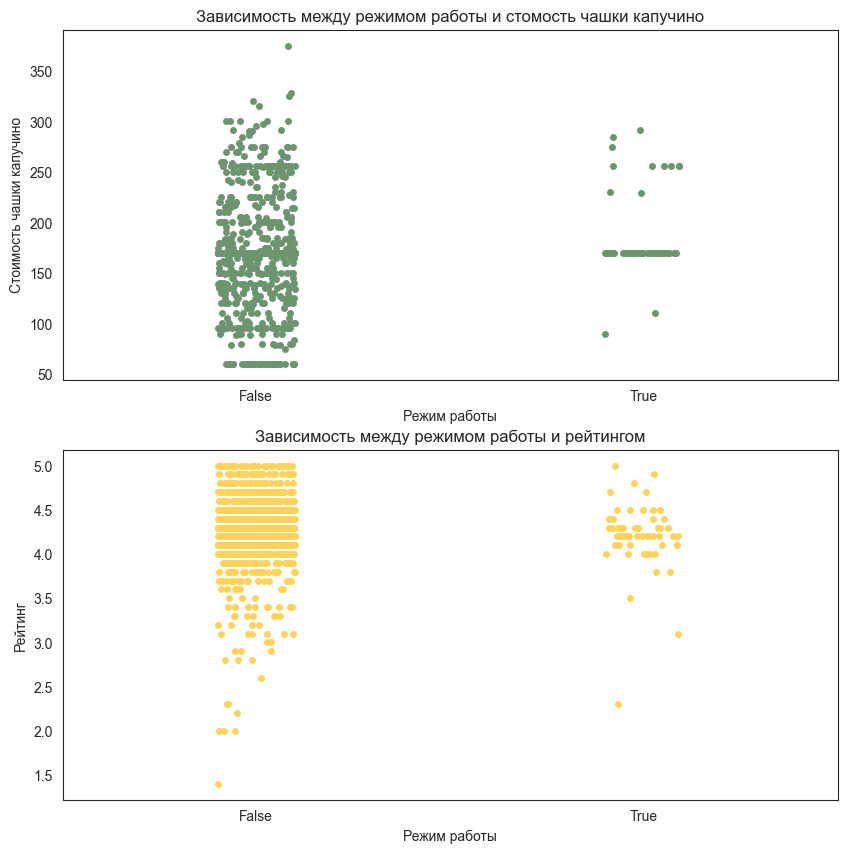

In [90]:
plt.figure(figsize=(10, 10))

plt.subplot(2, 1, 1)
sns.stripplot(x='is_24_7', y='middle_coffee_cup', data=df_cofe_bill_more_0, color = '#6C946F') 
plt.title('Зависимость между режимом работы и стомость чашки капучино')
plt.xlabel('Режим работы')
plt.ylabel('Стоимость чашки капучино')

plt.subplot(2, 1, 2)
sns.stripplot(x='is_24_7', y='rating', data=df_cofe_bill_more_0, color = '#FFD35A') 
plt.title('Зависимость между режимом работы и рейтингом')
plt.xlabel('Режим работы')
plt.ylabel('Рейтинг')

plt.show()

Не прослеживается закономерность между режимом работы и рейтингом/стоимость чашки капучино 

### Количество посадочных мест

In [91]:
df_cofe['seats'].describe()

count    1413.000000
mean       94.866242
std        83.127369
min         0.000000
25%        70.000000
50%        80.000000
75%        80.000000
max      1040.000000
Name: seats, dtype: float64

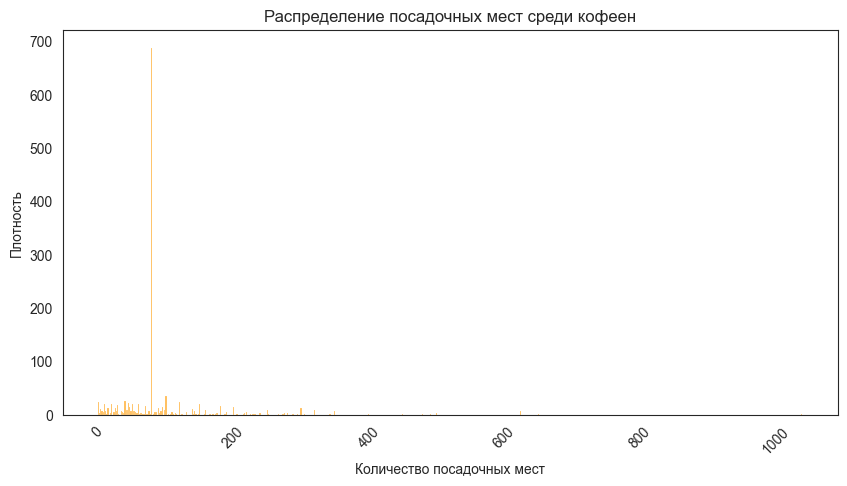

In [92]:
plt.figure(figsize=(10, 5))
 
sns.histplot(x='seats', data=df_cofe, color = '#FFA823')
plt.xticks(rotation=45)
plt.title('Распределение посадочных мест среди кофеен')
plt.xlabel('Количество посадочных мест')
plt.ylabel('Плотность')
plt.show()

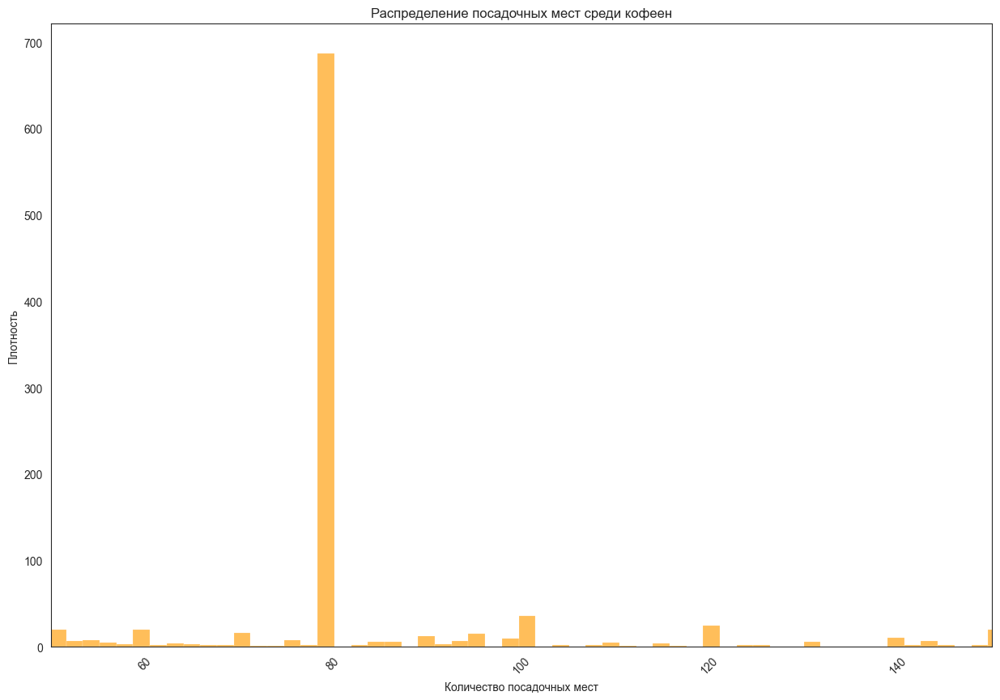

In [93]:
plt.figure(figsize=(15, 10))
 
ax = sns.histplot(x='seats', data=df_cofe, color = '#FFA823')
plt.xticks(rotation=45)
plt.title('Распределение посадочных мест среди кофеен')
plt.xlabel('Количество посадочных мест')
plt.ylabel('Плотность')
ax.set_xlim(50, 150)
plt.show()

Больше всего кофеен имеет около 80 посадочных мест. Это соответствует медианному значению, которым были заполнены пропуски

In [94]:
df_cofe_seats_middlecup = df_cofe.query('seats < 400 & seats > 0')
df_cofe_seats_middlecup  = df_cofe_seats_middlecup.query('middle_coffee_cup > 0 & middle_coffee_cup < 1500')


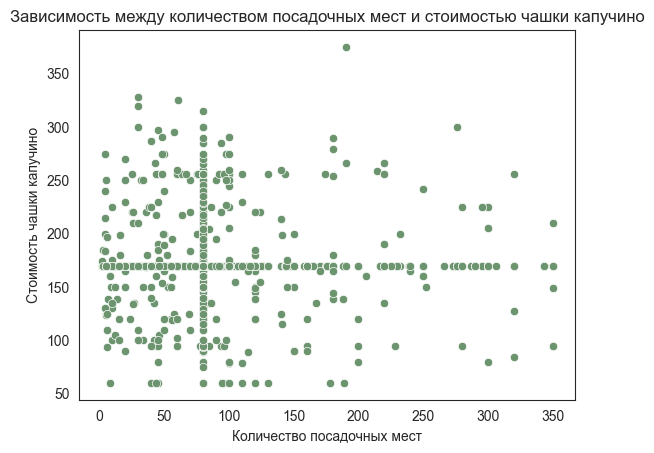

In [95]:

sns.scatterplot(x='seats', y='middle_coffee_cup', data=df_cofe_seats_middlecup, color = '#6C946F') 
plt.title('Зависимость между количеством посадочных мест и стоимостью чашки капучино')
plt.xlabel('Количество посадочных мест')
plt.ylabel('Стоимость чашки капучино')
plt.show()

Зависимость между  количеством посадочных мест и стоимостью чашки капучино не прослеживается

### Сетевые и несетевые кофейни

In [96]:
df_cofe['chain'].value_counts()

chain
1    720
0    693
Name: count, dtype: int64

In [97]:
df_cofe_distr_chain = (df_cofe.pivot_table(index = 'district', columns = 'chain', values = 'name', aggfunc = 'count').reset_index().sort_values(by = 1, ascending = False))
df_cofe_distr_chain.columns = ['district', 'не сеть', 'сеть']
df_cofe_distr_chain['rat'] =  round(df_cofe_distr_chain['сеть'] /(df_cofe_distr_chain['сеть']  + df_cofe_distr_chain['не сеть'] ), 2)      
df_cofe_distr_chain.sort_values(by = 'rat', ascending = False)

,district,не сеть,сеть,rat
1,Западный административный округ,57,93,0.62
4,Северо-Западный административный округ,28,34,0.55
5,Центральный административный округ,207,221,0.52
7,Юго-Западный административный округ,46,50,0.52
2,Северный административный округ,96,97,0.50
3,Северо-Восточный административный округ,80,79,0.50
8,Южный административный округ,65,66,0.50
0,Восточный административный округ,54,51,0.49
6,Юго-Восточный административный округ,60,29,0.33


Посмотрели на соотношение сетевых и несетевых кофеен по районам. В большинстве округов соотношение примерно 50 на 50. В Западном округе соотношение сетевых к несетевым 62 к 38. Это округ с довольно высокими ценами по всем заведениям и по кофейням. На уровне Центрального района.
В Юго-Восточном соотношение сетевых к несетевым - 33 к 67. Этот район чем-то отличается. Возможно, здесь больше производств  вокруг, которых скапливаются недорогие точки питания по типу шавермы.

В северо-Западном (в котором меньше всего кофеен), соотношение сетевых  к несетевым 55 к 45. Может в этом округе больше новых ЖК, в которых только начинают размещаться точки питания. И предприниматели стремятся занять нишу до прихода сетевых гигантов

### Рейтинги кофеен

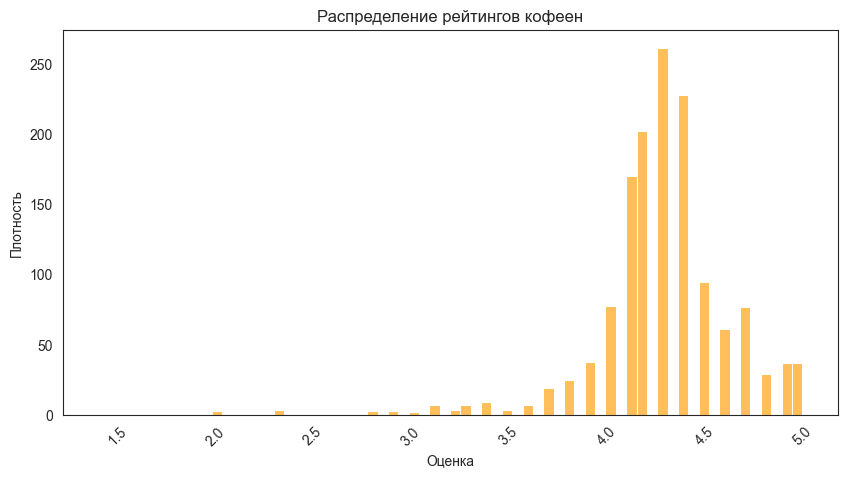

In [98]:
plt.figure(figsize=(10, 5))
 
sns.histplot(x='rating', data=df_cofe, color = '#FFA823')
plt.xticks(rotation=45)
plt.title('Распределение рейтингов кофеен')
plt.xlabel('Оценка')
plt.ylabel('Плотность')
plt.show()

Большинство кофеен получают оценку примерно от 4.0 до 4.7. Есть несколько выбивающихся с низкими оценками в районе 2

In [99]:
df_cofe_rat = (df_cofe.groupby('district').agg({'rating':'mean'}).sort_values(by = 'rating', ascending = False).reset_index())
df_cofe_rat

,district,rating
0,Центральный административный округ,4.336449
1,Северо-Западный административный округ,4.325806
2,Северный административный округ,4.291710
3,Юго-Западный административный округ,4.283333
4,Восточный административный округ,4.282857
5,Южный административный округ,4.232824
6,Юго-Восточный административный округ,4.225843
7,Северо-Восточный административный округ,4.216981
8,Западный административный округ,4.195333


(4.2, 4.5)

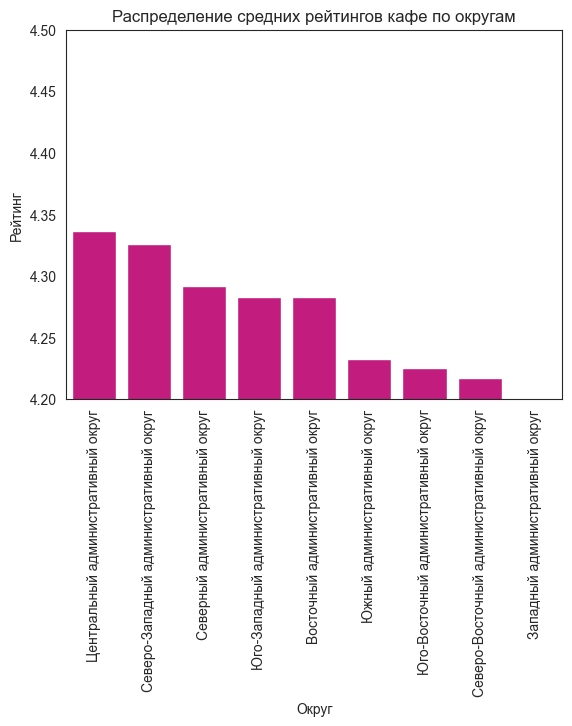

In [100]:
ax = sns.barplot(x='district',
            y='rating',
            data=df_cofe_rat,
            color = '#DC0083')
 
plt.xticks(rotation=90)

ax.set_title('Распределение средних рейтингов кафе по округам')
ax.set(xlabel='Округ', ylabel='Рейтинг')
ax.set_ylim(4.2, 4.5)

Средние рейтингки по округам практически не отличаются. Колебания от 4.19 до 4.33

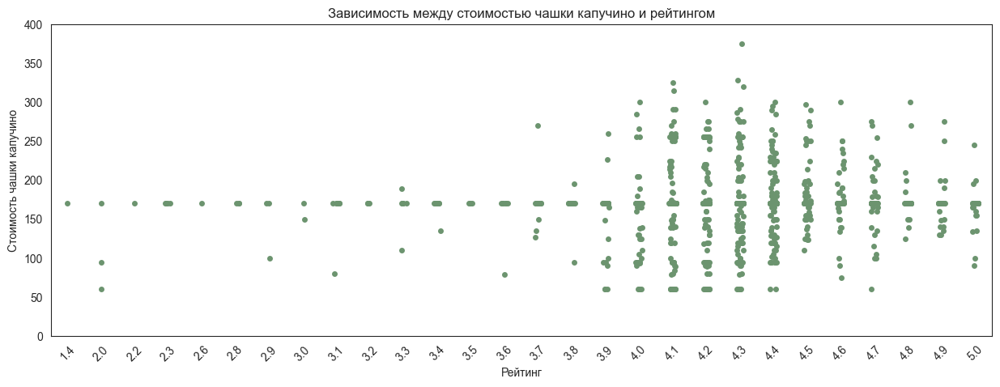

In [101]:
plt.figure(figsize=(15, 5))
ax = sns.stripplot(x='rating', y='middle_coffee_cup', data=df_cofe_bill_more_0, color = '#6C946F') 
plt.title('Зависимость между стоимостью чашки капучино и рейтингом')
plt.xlabel('Рейтинг')
plt.ylabel('Стоимость чашки капучино')
plt.xticks(rotation=45)
ax.set_ylim(0, 400)
plt.show()

Низкие оценки в районе двух ставят чашке кофе до 100 рублей. Но это не мешает дешевому кофе получать хорошие оценки. Прямой связи нет. Как некачественный дешевый кофе может получать плохие оценки, так и стоимость может влиять на оценку посетителя, подменяя его реальные ощущения. Посмотрим, как в принципе распределена стоимость

### Распределение стоимости чашки кофе

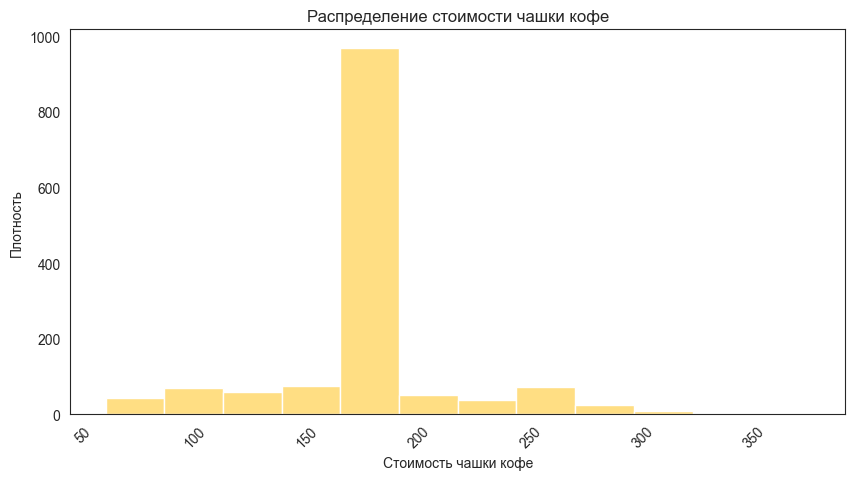

In [102]:
plt.figure(figsize=(10, 5))
 
sns.histplot(x='middle_coffee_cup', data=df_cofe_bill_more_0, color = '#FFD35A')
plt.xticks(rotation=45)
plt.title('Распределение стоимости чашки кофе')
plt.xlabel('Стоимость чашки кофе')
plt.ylabel('Плотность')
plt.show()

In [103]:
df_cofe_bill_more_0['middle_coffee_cup'].median()

170.0

Для распределения стоимости чашки кофе использовали датасет без нулевых значений, а также без ошибочной стоимости в Шоколаднице, равной 1588. Цены рознятся от 50 до 350. Преобладает медианное значение, которым заполнили пропуски = 170

### Вывод 

Кофейни занимают третье место по популярности среди всех заведений общественного питания Москвы.

Наибольший интерес представляют округа: Северо-Восточный, Северо-Западный, Центральный, Западный  

Не рекомендуется делать круглосуточный режим работы. Это не влияет ни на среднюю стоимость кофе, ни на рейтинг.

В Западном округе преобладают сетевые кофейни - 62%. От сетевых точек питания всегда понимаешь, что ожидать. Несетевое, которое посетитель видит в первый раз, может вызвать сомнения. Поэтому район с давлением сетевых кофеен, стоит рассматривать с осторожноситю.

В большинстве кофеен не больше 100 посадочных мест. Редко - больше 400.

Не найдено закономерности, влияющей не рейтинг. Разница в рейтингах по районам почти не заметна. Медианная стоимость чашки капучино - 169.50 рублей. 